In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt 
from tqdm import tqdm
import torch
from PIL import Image  
import torch.optim as optim
from torch import nn
    
import torch  
import matplotlib.pyplot as plt  
import torch.nn.functional as F


In [2]:
device = 'cuda:1'

In [3]:

class SoftmaxProbs(nn.Module):
    #Custom Linear layer but mimics a standard linear layer
    def __init__(self):
        
        super().__init__()
    def forward(self, res):
        return F.softmax(torch.flatten(res, start_dim=-2), dim=-1).view(*res.shape)

softmax_probs_unet = SoftmaxProbs()

import torch  
import torch.nn as nn  
  
class CD_JSD_Loss(nn.Module):  
    def __init__(self, x_min=0, x_max=1, y_min=0, y_max=1, grid_size=128, device='cpu'):
        self.x_min = x_min
        self.x_max = x_max
        self.y_min = y_min
        self.y_max = y_max
        self.grid_size = grid_size
        self.device = device
        self.epsilon = 1e-8
        self.axis_x = torch.linspace(self.x_min, self.x_max, self.grid_size).unsqueeze(0).to(self.device)
        self.axis_y = torch.linspace(self.x_min, self.x_max, self.grid_size).unsqueeze(0).to(self.device)
        super(CD_JSD_Loss, self).__init__()  
  
    def entropy(self, probs):    
        return -torch.sum(probs*torch.log(probs+self.epsilon), dim=(-1,-2))  
  
    def jsd(self, prob_P, prob_Q):    
        mean_prob = (prob_P+prob_Q)/2    
        return self.entropy(mean_prob)-(self.entropy(prob_P)+self.entropy(prob_Q))/2  
  
    def centroid_dist(self, prob_P, prob_Q):    
        mean_axis_x = torch.einsum('ijkl,kl->ij', prob_Q, self.axis_x) - torch.einsum('ijkl,kl->ij', prob_P, self.axis_x)  
        mean_axis_y = torch.einsum('ijkl,kl->ij', prob_Q.transpose(-1,-2), self.axis_y) - torch.einsum('ijkl,kl->ij', prob_P.transpose(-1,-2), self.axis_y)  
        return torch.sqrt(mean_axis_x**2 + mean_axis_y**2) / np.sqrt(2)  
 
    def forward(self, prob_P, prob_Q):    
        return self.jsd(prob_P, prob_Q)+self.centroid_dist(prob_P, prob_Q)



cd_jsd_loss = CD_JSD_Loss(device=device)  
# Define the neural network  
class Net(nn.Module):    
    def __init__(self, input_dim, hidden_dim, output_dim):    
        super(Net, self).__init__()    
        self.fc1 = nn.Linear(input_dim, hidden_dim)    
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)    
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)    
        self.fc4 = nn.Linear(hidden_dim, hidden_dim)    
        self.fc5 = nn.Linear(hidden_dim, output_dim)  
  
        # Layer normalization layers  
        self.norm1 = nn.LayerNorm(hidden_dim)  
        self.norm2 = nn.LayerNorm(hidden_dim)  
        self.norm3 = nn.LayerNorm(hidden_dim)  
        self.norm4 = nn.LayerNorm(hidden_dim)  
    
    def forward(self, x):    
        x = torch.relu(self.norm1(self.fc1(x)))    
        x = torch.relu(self.norm2(self.fc2(x)))    
        x = torch.relu(self.norm3(self.fc3(x)))    
        x = torch.relu(self.norm4(self.fc4(x)))  
        x = self.fc5(x)  
        return x  


from torch.nn.functional import softmax  
  
# Define the function to compute softmax probabilities  
def softmax_probs(scores):  
    probs = softmax(scores, dim=0)  
    return probs  
  
# Compute the gradients of log_Z with respect to the input points  
def compute_grad_log_Z(model, points):  
    # Forward pass  
    log_Z = model(points)  
      
    # Compute gradients  
    # Since we are using batched input, we need to specify that we want gradients for each item in the batch  
    grad_log_Z = torch.autograd.grad(outputs=log_Z, inputs=points, grad_outputs=torch.ones_like(log_Z), create_graph=True)[0]  
      
    return grad_log_Z, log_Z  
  
# Compute the probability distribution on the domain with coordinates base_points  
def compute_probs(model, base_points, t_prime):  
    # Initialize a list to store the softmax probabilities for each t_prime  
    probs_list = []  
      
    # Compute log_Z at base_points  
    log_Z_base = model(base_points)  
      
    for t in t_prime:  
        # Compute grad(log_Z) at point t  
        grad_log_Z_t, _ = compute_grad_log_Z(model, t.unsqueeze(0))  
          
        # Compute scores for softmax  
        scores = -1000 * (grad_log_Z_t @ base_points.T - log_Z_base.T).squeeze()  
          
        # Compute softmax probabilities and add to the list  
        probs_list.append(softmax_probs(scores))  
      
    # Concatenate the list of tensors along the first dimension to get the final probs tensor  
    probs = torch.stack(probs_list)  
      
    return probs  
def compute_conv_loss(model, num_samples = 300):
    # Compute convexity loss  
    # number of random pairs to sample for convexity loss  
    a = torch.rand(num_samples, 2).to(device)  
    b = torch.rand(num_samples, 2).to(device)  
    f_a = model(a)  
    f_b = model(b)  
    f_mid = model((a + b) / 2)  

    # Add a penalty if the convexity constraint is violated  
    convexity_loss = torch.relu((f_a + f_b) / 2-f_mid).mean()
    return convexity_loss



In [4]:
import torch
from torch.utils.data import Dataset, DataLoader

class CustomDataset(Dataset):
    def __init__(self, parameters, posteriors):
        self.parameters = parameters
        self.posteriors = posteriors

    def __len__(self):
        return len(self.parameters)

    def __getitem__(self, idx):
        return self.parameters[idx], self.posteriors[idx]

In [5]:
# parameters_arr = torch.load('parameters_arr.pth')
# predicted_posterior_arr = torch.load('predicted_posterior_arr.pth')
# parameters_arr.shape, predicted_posterior_arr.shape

In [6]:
DATASETS_PATH = '/home/alexander/external_storage/alexander/DATA/sk_integration/data/grid_generation/'
parameters_arr = np.load(DATASETS_PATH+"labels.npy",)
predicted_posterior_arr =  np.load(DATASETS_PATH+"posterior_distributions.npy",) 

In [7]:
dataset = CustomDataset(parameters_arr, predicted_posterior_arr)

batch_size = 32  
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)


batch_parameters, batch_posteriors  = next(iter(dataloader))
print(batch_parameters.shape, batch_posteriors.shape)

torch.Size([32, 2]) torch.Size([32, 1, 128, 128])


In [8]:
# Create the neural network and move it to GPU if available  
model = Net(2, 512, 1).to(device)  

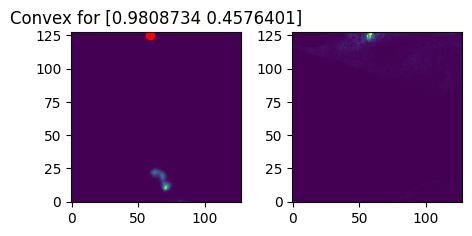

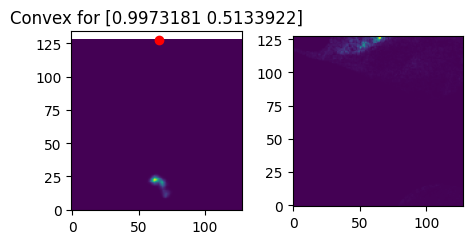

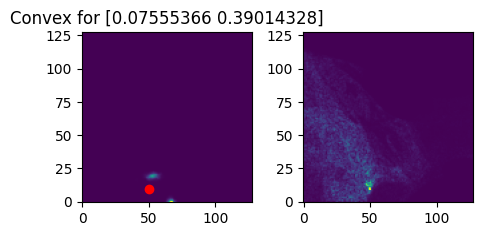

In [9]:
for _ in range(3):
    batch_parameters, batch_posteriors = next(iter(dataloader))

    predicted_posterior = batch_posteriors.to(device).permute(0,1,3,2)
    
    image_size = 128  
    linspaceX = torch.linspace(0.,1,steps=image_size)  
    linspaceY = torch.linspace(0.,1,steps=image_size)  
    base_points = torch.cartesian_prod(linspaceX, linspaceY)  
    base_points.requires_grad = True  
    base_points = base_points.to(device)  
    
    parameters = batch_parameters.to(device).to(torch.float)
    parameters.requires_grad = True  
    
    
    # Compute probability distribution  
    probs = compute_probs(model, base_points, parameters) 
    predicted_posterior_from_convex = probs.reshape(-1,1,image_size, image_size)

    
    plt.figure(figsize=(3*3,3))
    plt.subplot(141)
    plt.imshow(predicted_posterior_from_convex[0].cpu().detach().numpy()[0],origin="lower")
    plt.scatter( parameters[0].detach().cpu().numpy()[1]*128, parameters[0].detach().cpu().numpy()[0]*128, c='r')
    plt.title(f'Convex for {parameters[0].detach().cpu().numpy()}')
    plt.subplot(142)
    plt.imshow(predicted_posterior[0][0].cpu().detach().numpy(),origin="lower")
    plt.tight_layout()  # Optional: Adjusts the spacing between subplots to prevent overlap
    plt.show()

In [13]:

mse_loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)  

for epoch in range(30):
    print(f"Starting epoch={epoch} ...")
    loss_mean = []
    counter = 0
    for batch_parameters, batch_posteriors  in tqdm(dataloader):
        
        optimizer.zero_grad()
        
        parameters = batch_parameters.to(device)
        predicted_posterior = batch_posteriors.to(device).to(torch.float).permute(0,1,3,2)
        # predicted_posterior = softmax_probs_unet(predicted_posterior**2) # CHANGE! 

        
        image_size = 128  
        linspaceX = torch.linspace(0.,1,steps=image_size)  
        linspaceY = torch.linspace(0.,1,steps=image_size)  
        base_points = torch.cartesian_prod(linspaceX, linspaceY)  
        base_points.requires_grad = True  
        base_points = base_points.to(device)  

        parameters = parameters.to(device).to(torch.float)
        parameters.requires_grad = True  


        # Compute probability distribution  
        probs = compute_probs(model, base_points, parameters) 
        predicted_posterior_from_convex = probs.reshape(-1,1,image_size, image_size)

        jsd_loss = cd_jsd_loss(predicted_posterior, predicted_posterior_from_convex).mean()
        mse_loss = mse_loss_fn(predicted_posterior_from_convex, predicted_posterior).mean()
        convexity_loss = compute_conv_loss(model).mean()


        loss = jsd_loss + mse_loss + 0.01*convexity_loss # Example with weighted values
        
        loss_mean.append(loss.item())

        loss.backward()
        optimizer.step()
        
        counter += 1
        if counter%20 == 0:
            print(np.mean(loss_mean[-90:]))
            # print(torch.linalg.norm(buf-predicted_posterior))

    PATH = "conv_model_diff_clip_v1.pt"  
    torch.save(model.state_dict(), PATH)  
            
    print(np.mean(loss_mean))

Starting epoch=0 ...


  1%|          | 21/1879 [00:02<03:53,  7.95it/s]

0.22226001024246217


  2%|▏         | 41/1879 [00:05<03:39,  8.37it/s]

0.22279899716377258


  3%|▎         | 61/1879 [00:07<03:37,  8.35it/s]

0.22389235819379488


  4%|▍         | 81/1879 [00:10<03:44,  8.02it/s]

0.22331140637397767


  5%|▌         | 101/1879 [00:12<03:38,  8.15it/s]

0.22216155148214764


  6%|▋         | 121/1879 [00:14<03:29,  8.39it/s]

0.22249404191970826


  8%|▊         | 141/1879 [00:17<03:08,  9.23it/s]

0.22380315843555662


  9%|▊         | 161/1879 [00:19<03:33,  8.04it/s]

0.22354152914550568


 10%|▉         | 181/1879 [00:22<03:31,  8.02it/s]

0.22663968321349887


 11%|█         | 201/1879 [00:24<03:29,  8.02it/s]

0.22790503965483772


 12%|█▏        | 221/1879 [00:27<03:27,  8.01it/s]

0.22799054781595865


 13%|█▎        | 241/1879 [00:29<03:24,  8.01it/s]

0.2270438982380761


 14%|█▍        | 261/1879 [00:32<03:21,  8.02it/s]

0.22627614090840023


 15%|█▍        | 281/1879 [00:34<03:13,  8.26it/s]

0.22607826540867487


 16%|█▌        | 301/1879 [00:36<03:09,  8.31it/s]

0.2266843448082606


 17%|█▋        | 321/1879 [00:39<03:07,  8.32it/s]

0.22613530423906114


 18%|█▊        | 341/1879 [00:41<03:04,  8.33it/s]

0.22786446346176994


 19%|█▉        | 361/1879 [00:44<03:02,  8.33it/s]

0.22872666617234547


 20%|██        | 381/1879 [00:46<03:00,  8.31it/s]

0.22777886059549118


 21%|██▏       | 401/1879 [00:49<02:57,  8.32it/s]

0.22626449515422184


 22%|██▏       | 421/1879 [00:51<02:54,  8.34it/s]

0.22603166268931496


 23%|██▎       | 441/1879 [00:53<02:52,  8.32it/s]

0.22528324243095185


 25%|██▍       | 461/1879 [00:56<02:49,  8.35it/s]

0.22662503934568828


 26%|██▌       | 481/1879 [00:58<02:49,  8.27it/s]

0.22837891346878475


 27%|██▋       | 501/1879 [01:01<02:45,  8.33it/s]

0.22893870191441643


 28%|██▊       | 521/1879 [01:03<02:42,  8.34it/s]

0.22807383636633555


 29%|██▉       | 541/1879 [01:05<02:40,  8.36it/s]

0.2277513517273797


 30%|██▉       | 561/1879 [01:08<02:37,  8.37it/s]

0.22837071120738983


 31%|███       | 581/1879 [01:10<02:35,  8.35it/s]

0.22712017628881667


 32%|███▏      | 601/1879 [01:13<02:33,  8.33it/s]

0.22548693733082878


 33%|███▎      | 621/1879 [01:15<02:25,  8.66it/s]

0.22605807880560558


 34%|███▍      | 641/1879 [01:17<02:28,  8.34it/s]

0.22304581933551365


 35%|███▌      | 661/1879 [01:20<02:26,  8.33it/s]

0.22164613587988746


 36%|███▌      | 681/1879 [01:22<02:29,  8.01it/s]

0.2228860487540563


 37%|███▋      | 701/1879 [01:25<02:25,  8.10it/s]

0.22348328116867278


 38%|███▊      | 721/1879 [01:27<02:18,  8.33it/s]

0.22426474706994162


 39%|███▉      | 741/1879 [01:29<02:18,  8.21it/s]

0.22233235985040664


 41%|████      | 761/1879 [01:32<02:04,  8.99it/s]

0.22301548024018605


 42%|████▏     | 781/1879 [01:34<02:05,  8.74it/s]

0.22105089608165954


 43%|████▎     | 801/1879 [01:36<02:11,  8.19it/s]

0.2236790648765034


 44%|████▎     | 821/1879 [01:39<02:08,  8.23it/s]

0.22509559823407066


 45%|████▍     | 841/1879 [01:41<02:06,  8.24it/s]

0.2238208759162161


 46%|████▌     | 861/1879 [01:44<02:03,  8.25it/s]

0.22440853979852465


 47%|████▋     | 881/1879 [01:46<02:02,  8.18it/s]

0.22361243036058215


 48%|████▊     | 901/1879 [01:49<01:59,  8.19it/s]

0.22420590553018782


 49%|████▉     | 921/1879 [01:51<01:56,  8.20it/s]

0.22558115869760514


 50%|█████     | 941/1879 [01:54<01:58,  7.91it/s]

0.22560711287789875


 51%|█████     | 961/1879 [01:56<01:55,  7.97it/s]

0.22413820558124117


 52%|█████▏    | 981/1879 [01:59<01:52,  7.98it/s]

0.22660263975461323


 53%|█████▎    | 1001/1879 [02:01<01:46,  8.27it/s]

0.22696705096297795


 54%|█████▍    | 1021/1879 [02:03<01:43,  8.27it/s]

0.22719018674559063


 55%|█████▌    | 1041/1879 [02:06<01:40,  8.34it/s]

0.2253547532690896


 56%|█████▋    | 1061/1879 [02:08<01:38,  8.34it/s]

0.22465295443932215


 58%|█████▊    | 1081/1879 [02:11<01:37,  8.22it/s]

0.22599573731422423


 59%|█████▊    | 1101/1879 [02:13<01:33,  8.34it/s]

0.22486217634545433


 60%|█████▉    | 1121/1879 [02:15<01:30,  8.35it/s]

0.22320108181900447


 61%|██████    | 1141/1879 [02:18<01:28,  8.33it/s]

0.2256134260031912


 62%|██████▏   | 1161/1879 [02:20<01:26,  8.26it/s]

0.22445557978418137


 63%|██████▎   | 1181/1879 [02:22<01:16,  9.14it/s]

0.22366452995273803


 64%|██████▍   | 1201/1879 [02:25<01:13,  9.17it/s]

0.22327272527747685


 65%|██████▍   | 1221/1879 [02:27<01:11,  9.14it/s]

0.2238206985923979


 66%|██████▌   | 1241/1879 [02:29<01:09,  9.16it/s]

0.22568474196725422


 67%|██████▋   | 1261/1879 [02:31<01:07,  9.14it/s]

0.22825473927789264


 68%|██████▊   | 1281/1879 [02:33<01:05,  9.15it/s]

0.23015603721141814


 69%|██████▉   | 1301/1879 [02:36<01:03,  9.14it/s]

0.23083458029561574


 70%|███████   | 1321/1879 [02:38<01:01,  9.09it/s]

0.227064501411385


 71%|███████▏  | 1341/1879 [02:40<00:58,  9.16it/s]

0.22571721060408487


 72%|███████▏  | 1361/1879 [02:42<00:56,  9.14it/s]

0.22308741824494469


 73%|███████▎  | 1381/1879 [02:44<00:54,  9.09it/s]

0.22220070213079451


 75%|███████▍  | 1401/1879 [02:47<00:52,  9.15it/s]

0.2238294177585178


 76%|███████▌  | 1421/1879 [02:49<00:50,  9.15it/s]

0.22457151297065947


 77%|███████▋  | 1441/1879 [02:51<00:48,  9.08it/s]

0.2232946366071701


 78%|███████▊  | 1461/1879 [02:53<00:45,  9.13it/s]

0.22338664796617297


 79%|███████▉  | 1481/1879 [02:55<00:43,  9.15it/s]

0.22487092829412883


 80%|███████▉  | 1501/1879 [02:58<00:41,  9.15it/s]

0.22372981591357124


 81%|████████  | 1521/1879 [03:00<00:43,  8.30it/s]

0.22438199553224775


 82%|████████▏ | 1541/1879 [03:02<00:41,  8.19it/s]

0.22638201398981941


 83%|████████▎ | 1561/1879 [03:05<00:38,  8.31it/s]

0.22424873891803954


 84%|████████▍ | 1581/1879 [03:07<00:35,  8.30it/s]

0.22460567073689566


 85%|████████▌ | 1601/1879 [03:09<00:33,  8.31it/s]

0.22384809586736892


 86%|████████▋ | 1621/1879 [03:12<00:31,  8.32it/s]

0.22386693441205555


 87%|████████▋ | 1641/1879 [03:14<00:27,  8.64it/s]

0.22343174384699926


 88%|████████▊ | 1661/1879 [03:16<00:23,  9.16it/s]

0.22386254949702156


 89%|████████▉ | 1681/1879 [03:19<00:21,  9.11it/s]

0.22250494228469


 91%|█████████ | 1701/1879 [03:21<00:19,  9.13it/s]

0.2236019202404552


 92%|█████████▏| 1721/1879 [03:23<00:17,  9.14it/s]

0.21998013589117263


 93%|█████████▎| 1741/1879 [03:25<00:15,  9.14it/s]

0.22098418209287857


 94%|█████████▎| 1761/1879 [03:27<00:12,  9.13it/s]

0.22307950291368697


 95%|█████████▍| 1781/1879 [03:30<00:10,  9.10it/s]

0.2243029793103536


 96%|█████████▌| 1801/1879 [03:32<00:08,  9.12it/s]

0.22786136617263159


 97%|█████████▋| 1821/1879 [03:34<00:06,  9.14it/s]

0.22730907731586034


 98%|█████████▊| 1841/1879 [03:36<00:04,  9.14it/s]

0.22608595937490464


 99%|█████████▉| 1861/1879 [03:38<00:01,  9.14it/s]

0.2279921602871683


100%|██████████| 1879/1879 [03:40<00:00,  8.51it/s]


0.2251462803488402
Starting epoch=1 ...


  1%|          | 21/1879 [00:02<03:43,  8.33it/s]

0.22098151296377183


  2%|▏         | 41/1879 [00:04<03:40,  8.35it/s]

0.2214219570159912


  3%|▎         | 61/1879 [00:07<03:37,  8.35it/s]

0.22292515709996225


  4%|▍         | 81/1879 [00:09<03:25,  8.76it/s]

0.22242354694753885


  5%|▌         | 101/1879 [00:12<03:33,  8.33it/s]

0.22422579609685475


  6%|▋         | 121/1879 [00:14<03:31,  8.32it/s]

0.22389412406418058


  8%|▊         | 141/1879 [00:16<03:28,  8.33it/s]

0.2248838828669654


  9%|▊         | 161/1879 [00:19<03:26,  8.33it/s]

0.2255629516310162


 10%|▉         | 181/1879 [00:21<03:23,  8.33it/s]

0.2235129894481765


 11%|█         | 201/1879 [00:24<03:21,  8.33it/s]

0.22383110539780723


 12%|█▏        | 221/1879 [00:26<03:19,  8.33it/s]

0.22149744000699784


 13%|█▎        | 241/1879 [00:28<03:16,  8.33it/s]

0.22195628997352387


 14%|█▍        | 261/1879 [00:31<03:14,  8.31it/s]

0.2219397586252954


 15%|█▍        | 281/1879 [00:33<03:12,  8.32it/s]

0.21952120148473317


 16%|█▌        | 301/1879 [00:36<03:09,  8.34it/s]

0.22014502899514304


 17%|█▋        | 321/1879 [00:38<03:06,  8.34it/s]

0.22338528434435526


 18%|█▊        | 341/1879 [00:40<03:06,  8.26it/s]

0.22472718573278852


 19%|█▉        | 361/1879 [00:43<03:02,  8.34it/s]

0.22623387906286452


 20%|██        | 381/1879 [00:45<02:59,  8.34it/s]

0.22971072561211056


 21%|██▏       | 401/1879 [00:48<02:57,  8.33it/s]

0.22702310399876702


 22%|██▏       | 421/1879 [00:50<02:57,  8.20it/s]

0.221716065870391


 23%|██▎       | 441/1879 [00:52<02:53,  8.30it/s]

0.22075051168600718


 25%|██▍       | 461/1879 [00:55<02:51,  8.28it/s]

0.21922492070330513


 26%|██▌       | 481/1879 [00:57<02:46,  8.40it/s]

0.21836251633034812


 27%|██▋       | 501/1879 [01:00<02:46,  8.26it/s]

0.21853772583934997


 28%|██▊       | 521/1879 [01:02<02:44,  8.26it/s]

0.2215873782833417


 29%|██▉       | 541/1879 [01:05<02:41,  8.29it/s]

0.2221439465880394


 30%|██▉       | 561/1879 [01:07<02:39,  8.29it/s]

0.22147840542925729


 31%|███       | 581/1879 [01:09<02:36,  8.28it/s]

0.22223741147253248


 32%|███▏      | 601/1879 [01:12<02:36,  8.18it/s]

0.2212686383061939


 33%|███▎      | 621/1879 [01:14<02:31,  8.29it/s]

0.22335416128238042


 34%|███▍      | 641/1879 [01:17<02:29,  8.28it/s]

0.22154600206348632


 35%|███▌      | 661/1879 [01:19<02:27,  8.28it/s]

0.22207690808508132


 36%|███▌      | 681/1879 [01:21<02:11,  9.08it/s]

0.22063126530912186


 37%|███▋      | 701/1879 [01:24<02:09,  9.12it/s]

0.2172018579310841


 38%|███▊      | 721/1879 [01:26<02:07,  9.11it/s]

0.2171045141087638


 39%|███▉      | 741/1879 [01:28<02:04,  9.13it/s]

0.2180461284187105


 41%|████      | 761/1879 [01:30<02:01,  9.18it/s]

0.21599323865440156


 42%|████▏     | 781/1879 [01:32<02:01,  9.06it/s]

0.21662332167228063


 43%|████▎     | 801/1879 [01:35<01:58,  9.09it/s]

0.2170309563477834


 44%|████▎     | 821/1879 [01:37<01:56,  9.12it/s]

0.21738609108659956


 45%|████▍     | 841/1879 [01:39<01:51,  9.27it/s]

0.21600091755390166


 46%|████▌     | 861/1879 [01:41<01:51,  9.11it/s]

0.21828318817747963


 47%|████▋     | 881/1879 [01:43<01:50,  9.05it/s]

0.21770063473118675


 48%|████▊     | 901/1879 [01:46<01:47,  9.12it/s]

0.21695604224999746


 49%|████▉     | 921/1879 [01:48<01:53,  8.43it/s]

0.21789200752973556


 50%|█████     | 941/1879 [01:50<01:43,  9.09it/s]

0.21768969198067983


 51%|█████     | 961/1879 [01:52<01:48,  8.49it/s]

0.21861113591326609


 52%|█████▏    | 981/1879 [01:55<01:48,  8.27it/s]

0.21629858944151137


 53%|█████▎    | 1001/1879 [01:57<01:45,  8.30it/s]

0.2211762163374159


 54%|█████▍    | 1021/1879 [02:00<01:44,  8.24it/s]

0.22134774459732903


 55%|█████▌    | 1041/1879 [02:02<01:41,  8.28it/s]

0.2209405145711369


 56%|█████▋    | 1061/1879 [02:04<01:38,  8.27it/s]

0.2174172012342347


 58%|█████▊    | 1081/1879 [02:07<01:36,  8.26it/s]

0.2183046023050944


 59%|█████▊    | 1101/1879 [02:09<01:34,  8.23it/s]

0.21797318028079138


 60%|█████▉    | 1121/1879 [02:12<01:31,  8.26it/s]

0.21702134211858112


 61%|██████    | 1141/1879 [02:14<01:29,  8.23it/s]

0.21850311673349804


 62%|██████▏   | 1161/1879 [02:17<01:26,  8.28it/s]

0.220550261106756


 63%|██████▎   | 1181/1879 [02:19<01:24,  8.22it/s]

0.22092713680532244


 64%|██████▍   | 1201/1879 [02:21<01:21,  8.28it/s]

0.22010273105568356


 65%|██████▍   | 1221/1879 [02:24<01:19,  8.25it/s]

0.2215175093875991


 66%|██████▌   | 1241/1879 [02:26<01:12,  8.86it/s]

0.21961971835957633


 67%|██████▋   | 1261/1879 [02:29<01:14,  8.27it/s]

0.2202200710773468


 68%|██████▊   | 1281/1879 [02:31<01:13,  8.14it/s]

0.21787091559833952


 69%|██████▉   | 1301/1879 [02:33<01:09,  8.31it/s]

0.2152747882737054


 70%|███████   | 1321/1879 [02:36<01:06,  8.33it/s]

0.21528448545270495


 71%|███████▏  | 1341/1879 [02:38<01:04,  8.30it/s]

0.21530078765418795


 72%|███████▏  | 1361/1879 [02:41<01:02,  8.30it/s]

0.21465252488851547


 73%|███████▎  | 1381/1879 [02:43<00:55,  8.91it/s]

0.21911877344051997


 75%|███████▍  | 1401/1879 [02:45<00:56,  8.52it/s]

0.2195286876625485


 76%|███████▌  | 1421/1879 [02:48<00:55,  8.32it/s]

0.219714136256112


 77%|███████▋  | 1441/1879 [02:50<00:52,  8.32it/s]

0.2174791662229432


 78%|███████▊  | 1461/1879 [02:52<00:50,  8.32it/s]

0.21857021600008011


 79%|███████▉  | 1481/1879 [02:55<00:47,  8.32it/s]

0.21764627877208922


 80%|███████▉  | 1501/1879 [02:57<00:46,  8.21it/s]

0.22019979109366736


 81%|████████  | 1521/1879 [03:00<00:43,  8.31it/s]

0.22094640036424001


 82%|████████▏ | 1541/1879 [03:02<00:40,  8.31it/s]

0.21791218883461422


 83%|████████▎ | 1561/1879 [03:04<00:38,  8.19it/s]

0.21859301129976907


 84%|████████▍ | 1581/1879 [03:07<00:33,  9.03it/s]

0.21797459092405108


 85%|████████▌ | 1601/1879 [03:09<00:33,  8.35it/s]

0.21803678704632654


 86%|████████▋ | 1621/1879 [03:11<00:28,  9.12it/s]

0.22041390587886175


 87%|████████▋ | 1641/1879 [03:14<00:26,  9.14it/s]

0.218851062324312


 88%|████████▊ | 1661/1879 [03:16<00:23,  9.16it/s]

0.21882635636462106


 89%|████████▉ | 1681/1879 [03:18<00:21,  9.12it/s]

0.21609493576818042


 91%|█████████ | 1701/1879 [03:20<00:19,  9.13it/s]

0.21517819795343612


 92%|█████████▏| 1721/1879 [03:22<00:17,  9.12it/s]

0.21310363527801301


 93%|█████████▎| 1741/1879 [03:25<00:15,  9.12it/s]

0.21280963569879532


 94%|█████████▎| 1761/1879 [03:27<00:12,  9.10it/s]

0.2151821336812443


 95%|█████████▍| 1781/1879 [03:29<00:10,  9.12it/s]

0.2163857254717085


 96%|█████████▌| 1801/1879 [03:31<00:08,  9.14it/s]

0.21592797570758396


 97%|█████████▋| 1821/1879 [03:33<00:06,  9.14it/s]

0.2183533168501324


 98%|█████████▊| 1841/1879 [03:35<00:04,  9.13it/s]

0.21893697331349055


 99%|█████████▉| 1861/1879 [03:38<00:01,  9.09it/s]

0.22163271672195858


100%|██████████| 1879/1879 [03:40<00:00,  8.54it/s]


0.21979086852854018
Starting epoch=2 ...


  1%|          | 21/1879 [00:02<03:43,  8.31it/s]

0.23001472800970077


  2%|▏         | 41/1879 [00:04<03:41,  8.30it/s]

0.22001632116734982


  3%|▎         | 61/1879 [00:07<03:38,  8.32it/s]

0.221339991937081


  4%|▍         | 81/1879 [00:09<03:36,  8.32it/s]

0.22196081448346378


  5%|▌         | 101/1879 [00:12<03:14,  9.14it/s]

0.21942466762330798


  6%|▋         | 121/1879 [00:14<03:12,  9.14it/s]

0.21892054826021196


  8%|▊         | 141/1879 [00:16<03:10,  9.13it/s]

0.217758286330435


  9%|▊         | 161/1879 [00:18<03:09,  9.09it/s]

0.2148982427186436


 10%|▉         | 181/1879 [00:20<03:07,  9.04it/s]

0.21508913073274824


 11%|█         | 201/1879 [00:22<03:04,  9.12it/s]

0.21344658368163638


 12%|█▏        | 221/1879 [00:25<03:01,  9.12it/s]

0.2149730665816201


 13%|█▎        | 241/1879 [00:27<02:59,  9.13it/s]

0.21660845230023065


 14%|█▍        | 261/1879 [00:29<03:06,  8.68it/s]

0.21398707810375425


 15%|█▍        | 281/1879 [00:31<03:12,  8.32it/s]

0.21716738740603128


 16%|█▌        | 301/1879 [00:34<03:09,  8.31it/s]

0.21709809535079533


 17%|█▋        | 321/1879 [00:36<03:07,  8.31it/s]

0.2162221997976303


 18%|█▊        | 341/1879 [00:39<02:59,  8.59it/s]

0.21684559368424947


 19%|█▉        | 361/1879 [00:41<03:04,  8.24it/s]

0.21703725225395626


 20%|██        | 381/1879 [00:44<03:00,  8.32it/s]

0.220872024860647


 21%|██▏       | 401/1879 [00:46<02:57,  8.31it/s]

0.2236893920434846


 22%|██▏       | 421/1879 [00:48<02:55,  8.32it/s]

0.22581914249393675


 23%|██▎       | 441/1879 [00:51<02:53,  8.29it/s]

0.22434626304441027


 25%|██▍       | 461/1879 [00:53<02:51,  8.27it/s]

0.2233955833646986


 26%|██▌       | 481/1879 [00:55<02:33,  9.10it/s]

0.22220316926638287


 27%|██▋       | 501/1879 [00:58<02:31,  9.10it/s]

0.22078911066055298


 28%|██▊       | 521/1879 [01:00<02:29,  9.09it/s]

0.21862319029039806


 29%|██▉       | 541/1879 [01:02<02:26,  9.13it/s]

0.2173264793223805


 30%|██▉       | 561/1879 [01:04<02:36,  8.43it/s]

0.21573151101668675


 31%|███       | 581/1879 [01:06<02:22,  9.08it/s]

0.21528221037652756


 32%|███▏      | 601/1879 [01:09<02:33,  8.33it/s]

0.21679350121153726


 33%|███▎      | 621/1879 [01:11<02:18,  9.11it/s]

0.21972104873922135


 34%|███▍      | 641/1879 [01:13<02:15,  9.12it/s]

0.22055530945460003


 35%|███▌      | 661/1879 [01:15<02:13,  9.14it/s]

0.21647018409437604


 36%|███▌      | 681/1879 [01:18<02:11,  9.14it/s]

0.21905493934949238


 37%|███▋      | 701/1879 [01:20<02:09,  9.10it/s]

0.21890575306283103


 38%|███▊      | 721/1879 [01:22<02:19,  8.32it/s]

0.21753739847077264


 39%|███▉      | 741/1879 [01:25<02:16,  8.31it/s]

0.2183879001273049


 41%|████      | 761/1879 [01:27<02:14,  8.32it/s]

0.21971451540788015


 42%|████▏     | 781/1879 [01:29<02:12,  8.29it/s]

0.2183950240413348


 43%|████▎     | 801/1879 [01:32<02:10,  8.28it/s]

0.21678870452774895


 44%|████▎     | 821/1879 [01:34<02:08,  8.24it/s]

0.2192785683605406


 45%|████▍     | 841/1879 [01:37<02:04,  8.32it/s]

0.21982554975483154


 46%|████▌     | 861/1879 [01:39<02:02,  8.32it/s]

0.21761888100041282


 47%|████▋     | 881/1879 [01:42<02:00,  8.31it/s]

0.21883074757125642


 48%|████▊     | 901/1879 [01:44<01:57,  8.33it/s]

0.2173183540503184


 49%|████▉     | 921/1879 [01:46<01:55,  8.32it/s]

0.2159250881936815


 50%|█████     | 941/1879 [01:49<01:42,  9.13it/s]

0.21342060383823183


 51%|█████     | 961/1879 [01:51<01:40,  9.14it/s]

0.21238454894887077


 52%|█████▏    | 981/1879 [01:53<01:38,  9.14it/s]

0.21366531401872635


 53%|█████▎    | 1001/1879 [01:55<01:35,  9.17it/s]

0.2139480330877834


 54%|█████▍    | 1021/1879 [01:57<01:33,  9.15it/s]

0.21582867271370357


 55%|█████▌    | 1041/1879 [02:00<01:32,  9.10it/s]

0.21834294862217374


 56%|█████▋    | 1061/1879 [02:02<01:30,  9.07it/s]

0.21987440437078476


 58%|█████▊    | 1081/1879 [02:04<01:27,  9.14it/s]

0.2176402567161454


 59%|█████▊    | 1101/1879 [02:06<01:24,  9.17it/s]

0.21834728684690263


 60%|█████▉    | 1121/1879 [02:08<01:22,  9.15it/s]

0.2174250826239586


 61%|██████    | 1141/1879 [02:10<01:20,  9.16it/s]

0.21627253078752093


 62%|██████▏   | 1161/1879 [02:13<01:19,  9.08it/s]

0.21758260362678103


 63%|██████▎   | 1181/1879 [02:15<01:23,  8.34it/s]

0.218190099298954


 64%|██████▍   | 1201/1879 [02:17<01:21,  8.30it/s]

0.21839346985022226


 65%|██████▍   | 1221/1879 [02:20<01:19,  8.31it/s]

0.21757928083340328


 66%|██████▌   | 1241/1879 [02:22<01:16,  8.29it/s]

0.21710064974096085


 67%|██████▋   | 1261/1879 [02:24<01:07,  9.16it/s]

0.2151604508360227


 68%|██████▊   | 1281/1879 [02:27<01:11,  8.36it/s]

0.21538352651728523


 69%|██████▉   | 1301/1879 [02:29<01:09,  8.30it/s]

0.21659464173846774


 70%|███████   | 1321/1879 [02:31<01:07,  8.28it/s]

0.21726715862751006


 71%|███████▏  | 1341/1879 [02:34<01:01,  8.79it/s]

0.21617980202039083


 72%|███████▏  | 1361/1879 [02:36<00:56,  9.12it/s]

0.21692630532715057


 73%|███████▎  | 1381/1879 [02:38<00:54,  9.16it/s]

0.21477795607513853


 75%|███████▍  | 1401/1879 [02:40<00:52,  9.15it/s]

0.21547716359297434


 76%|███████▌  | 1421/1879 [02:42<00:50,  9.15it/s]

0.2156152433819241


 77%|███████▋  | 1441/1879 [02:45<00:48,  9.10it/s]

0.2164659669001897


 78%|███████▊  | 1461/1879 [02:47<00:45,  9.15it/s]

0.21779669539795982


 79%|███████▉  | 1481/1879 [02:49<00:43,  9.15it/s]

0.2177574763695399


 80%|███████▉  | 1501/1879 [02:51<00:41,  9.13it/s]

0.2212831719054116


 81%|████████  | 1521/1879 [02:53<00:39,  9.12it/s]

0.22060460299253465


 82%|████████▏ | 1541/1879 [02:56<00:36,  9.14it/s]

0.21839477850331201


 83%|████████▎ | 1561/1879 [02:58<00:34,  9.09it/s]

0.21783988840050167


 84%|████████▍ | 1581/1879 [03:00<00:35,  8.32it/s]

0.218276028169526


 85%|████████▌ | 1601/1879 [03:03<00:33,  8.31it/s]

0.21650617255104912


 86%|████████▋ | 1621/1879 [03:05<00:28,  9.13it/s]

0.21527830792797936


 87%|████████▋ | 1641/1879 [03:07<00:26,  9.15it/s]

0.2174989107582304


 88%|████████▊ | 1661/1879 [03:09<00:23,  9.15it/s]

0.21623317417171267


 89%|████████▉ | 1681/1879 [03:11<00:21,  9.15it/s]

0.2163520594437917


 91%|█████████ | 1701/1879 [03:14<00:19,  9.13it/s]

0.2174827648533715


 92%|█████████▏| 1721/1879 [03:16<00:17,  9.11it/s]

0.21741328173213534


 93%|█████████▎| 1741/1879 [03:18<00:15,  9.12it/s]

0.2150537634889285


 94%|█████████▎| 1761/1879 [03:20<00:12,  9.10it/s]

0.2154671730266677


 95%|█████████▍| 1781/1879 [03:22<00:10,  9.11it/s]

0.21603729095723895


 96%|█████████▌| 1801/1879 [03:25<00:09,  8.43it/s]

0.2191179527176751


 97%|█████████▋| 1821/1879 [03:27<00:06,  8.31it/s]

0.22311520907613966


 98%|█████████▊| 1841/1879 [03:29<00:04,  8.29it/s]

0.22424116813474232


 99%|█████████▉| 1861/1879 [03:32<00:02,  8.31it/s]

0.2219399513469802


100%|██████████| 1879/1879 [03:34<00:00,  8.76it/s]


0.21800139789063605
Starting epoch=3 ...


  1%|          | 21/1879 [00:02<03:42,  8.33it/s]

0.2082741342484951


  2%|▏         | 41/1879 [00:04<03:41,  8.31it/s]

0.20913402065634729


  3%|▎         | 61/1879 [00:07<03:38,  8.31it/s]

0.21331602608164152


  4%|▍         | 81/1879 [00:09<03:35,  8.33it/s]

0.21763335783034563


  5%|▌         | 101/1879 [00:12<03:34,  8.29it/s]

0.2179807350039482


  6%|▋         | 121/1879 [00:14<03:33,  8.24it/s]

0.21863260484404035


  8%|▊         | 141/1879 [00:16<03:30,  8.27it/s]

0.21742014156447517


  9%|▊         | 161/1879 [00:19<03:33,  8.06it/s]

0.21770345701111687


 10%|▉         | 181/1879 [00:21<03:25,  8.26it/s]

0.21637091322077645


 11%|█         | 201/1879 [00:24<03:22,  8.30it/s]

0.2168209628926383


 12%|█▏        | 221/1879 [00:26<03:20,  8.27it/s]

0.21770623326301575


 13%|█▎        | 241/1879 [00:29<03:17,  8.28it/s]

0.21955207073026234


 14%|█▍        | 261/1879 [00:31<03:17,  8.19it/s]

0.22097388986084196


 15%|█▍        | 281/1879 [00:33<03:13,  8.27it/s]

0.21888830198182


 16%|█▌        | 301/1879 [00:36<03:14,  8.12it/s]

0.22007924798462125


 16%|█▌        | 302/1879 [00:36<03:10,  8.28it/s]


KeyboardInterrupt: 

In [11]:
model.load_state_dict(torch.load("conv_model_diff_clip.pt"))

/tmp/ipykernel_3643444/229948475.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("conv_model_diff_clip.pt"))


<All keys matched successfully>

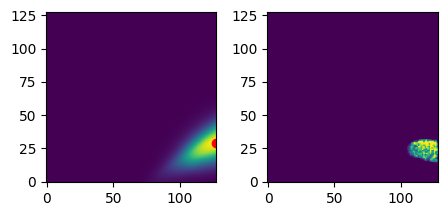

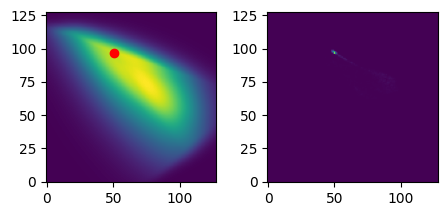

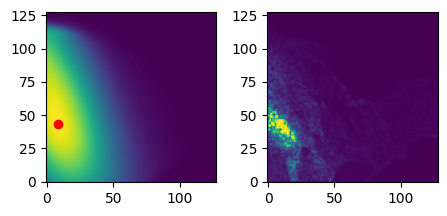

In [12]:
for _ in range(3):
    batch_parameters, batch_posteriors = next(iter(dataloader))

    predicted_posterior = batch_posteriors.to(device).permute(0,1,3,2)[0]

    # predicted_posterior = softmax_probs_unet(predicted_posterior.cpu().detach()**2) #CHANGE
    
    image_size = 128  
    linspaceX = torch.linspace(0.,1,steps=image_size)  
    linspaceY = torch.linspace(0.,1,steps=image_size)  
    base_points = torch.cartesian_prod(linspaceX, linspaceY)  
    base_points.requires_grad = True  
    base_points = base_points.to(device)  
    
    parameters = batch_parameters.to(device).to(torch.float)
    parameters.requires_grad = True  
    
    
    # Compute probability distribution  
    probs = compute_probs(model, base_points, parameters) 
    predicted_posterior_from_convex = probs.reshape(-1,1,image_size, image_size)

    
    plt.figure(figsize=(3*3,3))
    plt.subplot(141)
    plt.imshow(predicted_posterior_from_convex[0].cpu().detach().numpy()[0],origin="lower")
    plt.scatter( parameters[0].detach().cpu().numpy()[1]*128, parameters[0].detach().cpu().numpy()[0]*128, c='r')
    # plt.title(f'Convex for {parameters[0].detach().cpu().numpy()}')
    plt.subplot(142)
    plt.imshow(predicted_posterior[0].cpu().detach().numpy(),origin="lower")
    plt.tight_layout()  # Optional: Adjusts the spacing between subplots to prevent overlap
    plt.show()

In [53]:
image_size = 128

linspaceX = torch.linspace(0.,1,steps=image_size)
linspaceY = torch.linspace(0.,1,steps=image_size)
base_points = torch.cartesian_prod(linspaceX, linspaceY)
base_points.requires_grad = True
base_points = base_points.to(device)


base_points_tens = base_points.detach()

In [54]:
import torch

# Assuming log_Z is the output of your model and base_points is the input
log_Z = model(base_points)

# First derivatives
grad_outputs = torch.ones_like(log_Z)
gradients = torch.autograd.grad(outputs=log_Z, inputs=base_points,
                                grad_outputs=grad_outputs, create_graph=True)[0]

dfdT = gradients[:, 0]
dfdH = gradients[:, 1]

zdata = log_Z.unsqueeze(1).cpu().detach().flatten().numpy() #CHANGE

# Second derivatives
# Compute the gradient of dfdT with respect to base_points
d2fdT2 = torch.autograd.grad(outputs=dfdT, inputs=base_points,
                             grad_outputs=torch.ones_like(dfdT), create_graph=True)[0][:, 0]

d2fdTdH = torch.autograd.grad(outputs=dfdT, inputs=base_points,
                              grad_outputs=torch.ones_like(dfdT), create_graph=True)[0][:, 1]

# Compute the gradient of dfdH with respect to base_points
d2fdHdT = torch.autograd.grad(outputs=dfdH, inputs=base_points,
                              grad_outputs=torch.ones_like(dfdH), create_graph=True)[0][:, 0]

d2fdH2 = torch.autograd.grad(outputs=dfdH, inputs=base_points,
                             grad_outputs=torch.ones_like(dfdH), create_graph=True)[0][:, 1]


dfdT = dfdT.cpu().detach().numpy()
dfdH = dfdH.cpu().detach().numpy()

# Detach and convert to numpy arrays
d2fdT2 = d2fdT2.cpu().detach().numpy()
d2fdTdH = d2fdTdH.cpu().detach().numpy()
d2fdHdT = d2fdHdT.cpu().detach().numpy()
d2fdH2 = d2fdH2.cpu().detach().numpy()

# Now you have the second derivatives in numpy arrays
print("d2fdT2:", d2fdT2)
print("d2fdTdH:", d2fdTdH)
print("d2fdHdT:", d2fdHdT)
print("d2fdH2:", d2fdH2)

d2fdT2: [ 5.2268617e-05 -1.2469750e-03 -1.9040718e-03 ...  4.7433153e-02
  4.6980809e-02  4.7780704e-02]
d2fdTdH: [0.00535855 0.00356731 0.00233701 ... 0.01991423 0.01977574 0.02009181]
d2fdHdT: [0.00535856 0.0035673  0.00233701 ... 0.01991424 0.01977574 0.02009182]
d2fdH2: [-0.00923812 -0.01125906 -0.01328271 ...  0.00108611  0.00100194
  0.00120216]


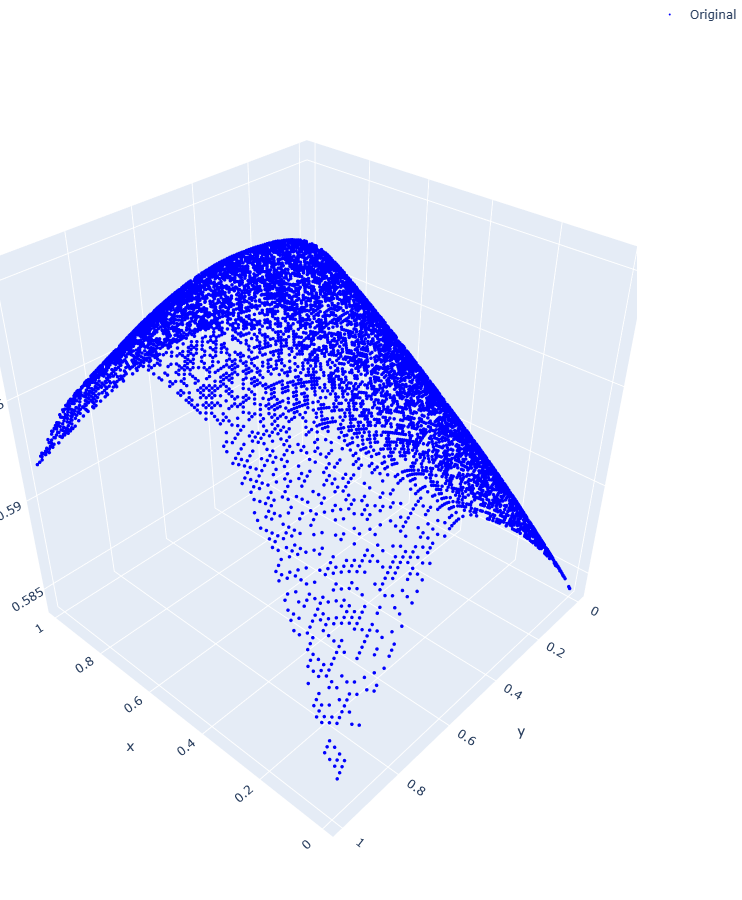

In [15]:
import plotly.graph_objects as go 
# Assuming base_points is a tensor. Convert to numpy array for plotting.  
xdata = base_points[:, 0].cpu().detach().numpy()  
ydata = base_points[:, 1].cpu().detach().numpy()  

# Plot the original zdata  
fig = go.Figure()  

plot_points = 10000
plot_ind = np.random.choice(range(image_size**2), plot_points)

scatter1 = go.Scatter3d(x=xdata.flatten()[plot_ind], y=ydata.flatten()[plot_ind], z=(zdata.flatten())[plot_ind], mode='markers', marker=dict(size=2, color='blue'), name='Original')  
  
# # Plot the transformed zdata_2  
# scatter2 = go.Scatter3d(x=xdata.flatten()[plot_ind], y=ydata.flatten()[plot_ind], z=approx_plane.flatten()[plot_ind], mode='markers', marker=dict(size=2, color='green'), name='Transformed')  
  
fig.add_trace(scatter1)  
# fig.add_trace(scatter2)  
  
fig.update_layout(autosize=False, width=900, height=900, showlegend=True, margin={"l":0,"r":0,"t":0,"b":0},  
                  scene=dict(aspectmode='cube'))  
  
fig.show()  

/tmp/ipykernel_3643444/536603871.py:32: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



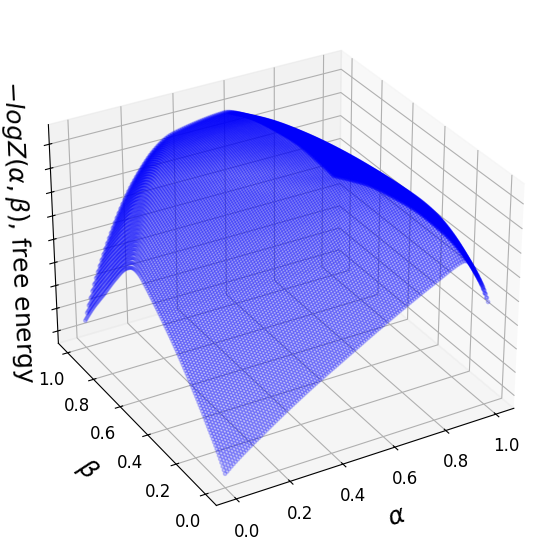

In [16]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt

# Create the figure and 3D axis
fig = plt.figure(figsize=(6.87634, 6.87634))
ax = plt.axes(projection='3d')

# Set the elevation and azimuth angles for the view
ax.elev = 30
ax.azim = +45 - 180 + 15

# Sort the data for better visualization
sorted_args = np.argsort(zdata)[:]

# Plot the 3D scatter plot
ax.scatter3D(xdata[sorted_args], ydata[sorted_args], zdata[sorted_args] + 0.05, alpha=0.2, c='b', s=6)

# Customize ticks and labels
ax.tick_params(axis='both', which='major', labelsize=12)

# Set axis labels
ax.set_xlabel(r'$\alpha$', fontsize=18, labelpad=10)
ax.set_ylabel(r'$\beta$', fontsize=18, labelpad=10)
ax.set_zlabel(r'$-log Z(\alpha,\beta)$, free energy', fontsize=18, labelpad=-5)

# Hide z-axis tick labels but keep ticks
ax.set_zticklabels([])

# Set the title
# plt.title("Negative free energy of diffusion", fontsize=20, pad=5)
plt.tight_layout()
# Show the plot
plt.show()

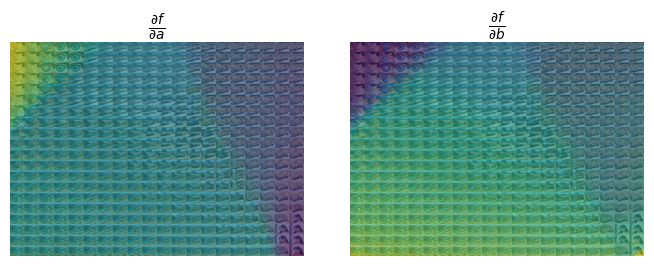

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg

image_size=128
fontsize=10
tick_fontsize=8
alpha = 0.4
# Load the image
overlay_image = mpimg.imread('output_grid_lower.png')

# Create a figure with two subplots
plt.figure(figsize=(6.75133, 6.75133 // 2))

# Plot df/da (previously df/dT)
plt.subplot(121)
plt.imshow(dfdT.reshape(image_size, image_size).T, origin='lower', cmap='viridis', extent=[0, 1, 0, 1])
plt.title(r'$\frac{\partial f}{\partial a}$', fontsize=fontsize+4)  # Title with fontsize
# plt.xlabel('a', fontsize=fontsize)  # X-axis label with fontsize
# plt.ylabel('b', fontsize=fontsize)  # Y-axis label with fontsize
# plt.xticks(fontsize=tick_fontsize)  # X-axis tick numbers with fontsize
# plt.yticks(fontsize=tick_fontsize)  # Y-axis tick numbers with fontsize
plt.axis('off')

# Overlay the image on the df/da plot
plt.imshow(overlay_image, extent=[0, 1, 0, 1], aspect='auto', alpha=alpha)

# Plot df/db (previously df/dH)
plt.subplot(122)
plt.imshow(dfdH.reshape(image_size, image_size).T, origin='lower', cmap='viridis', extent=[0, 1, 0, 1])
plt.title(r'$\frac{\partial f}{\partial b}$', fontsize=fontsize+4)  # Title with fontsize
# plt.xlabel('a', fontsize=fontsize)  # X-axis label with fontsize
# plt.ylabel('b', fontsize=fontsize)  # Y-axis label with fontsize
# plt.xticks(fontsize=tick_fontsize)  # X-axis tick numbers with fontsize
# plt.yticks(fontsize=tick_fontsize)  # Y-axis tick numbers with fontsize

# Overlay the image on the df/db plot
plt.imshow(overlay_image, extent=[0, 1, 0, 1], aspect='auto', alpha=alpha)

# Show the plot
plt.tight_layout()
plt.axis('off')


# plt.savefig('pahses.png', dpi=500, bbox_inches='tight', pad_inches=0.0)
plt.show()


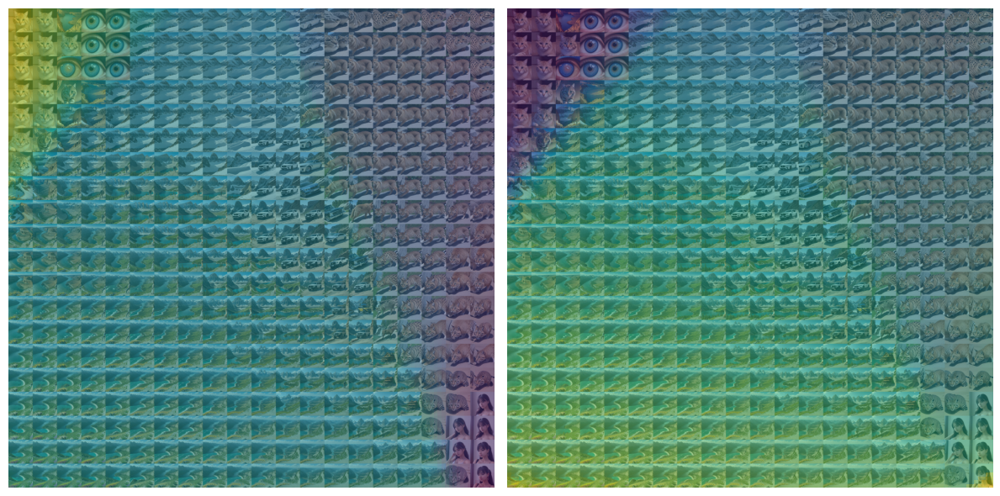

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg

# Parameters
image_size = 128
fontsize = 20
tick_fontsize = 8
alpha = 0.5  # Transparency for the overlay image

# Load the overlay image (phase boundaries)
overlay_image = mpimg.imread('output_grid_lower.png')

# Create a figure with two subplots
plt.figure(figsize=(12, 6))  # Adjusted figure size for better visibility

# Plot df/da (previously df/dT)
plt.subplot(121)
# Main plot: df/da
plt.imshow(dfdT.reshape(image_size, image_size).T, origin='lower', cmap='viridis', extent=[0, 1, 0, 1])
# plt.title(r'$\frac{\partial f}{\partial \alpha}$', fontsize=fontsize + 4)  # Title with fontsize
plt.axis('off')  # Hide axes

# Overlay the phase boundaries on df/da
plt.imshow(overlay_image, extent=[0, 1, 0, 1], aspect='auto', alpha=alpha, cmap='gray')  # Use grayscale for clarity

# Plot df/db (previously df/dH)
plt.subplot(122)
# Main plot: df/db
plt.imshow(dfdH.reshape(image_size, image_size).T, origin='lower', cmap='viridis', extent=[0, 1, 0, 1])
# plt.title(r'$\frac{\partial f}{\partial \beta}$', fontsize=fontsize + 4)  # Title with fontsize
plt.axis('off')  # Hide axes

# Overlay the phase boundaries on df/db
plt.imshow(overlay_image, extent=[0, 1, 0, 1], aspect='auto', alpha=alpha, cmap='gray')  # Use grayscale for clarity

# Adjust layout and display
plt.tight_layout()
plt.show()

# Save the figure (optional)
# plt.savefig('phases.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

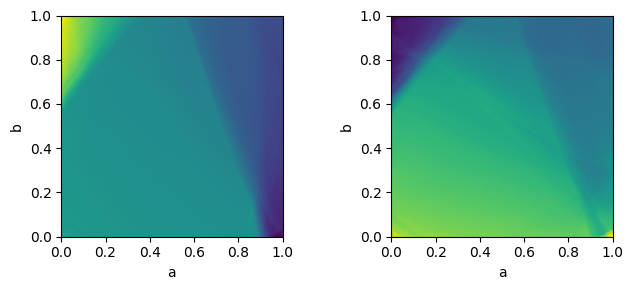

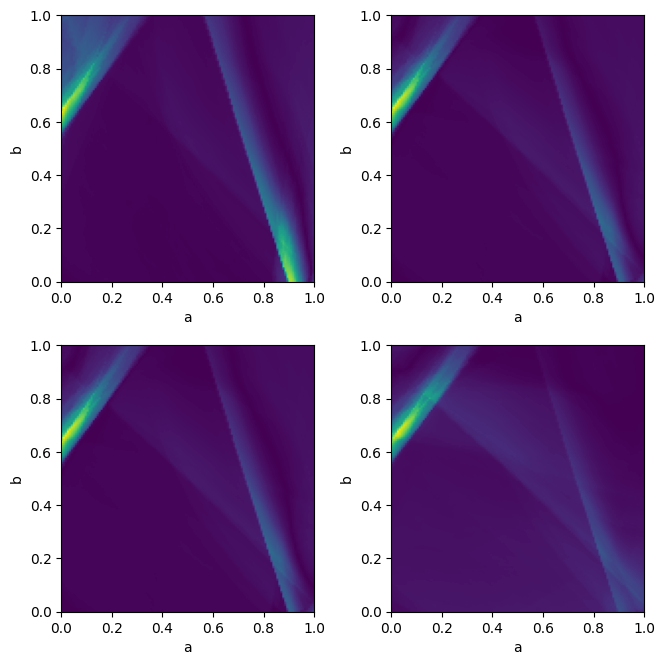

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have already computed the second derivatives as numpy arrays
# d2fdT2, d2fdTdH, d2fdHdT, d2fdH2

# Create a figure for df/dT and df/dH
plt.figure(figsize=(6.75133, 6.75133//2))

# Plot df/dT
plt.subplot(121)
plt.imshow(dfdT.reshape(image_size, image_size).T, origin='lower', extent=[0, 1, 0, 1])
# plt.title('df/dT')
plt.xlabel('a')  # Add x-axis label
plt.ylabel('b')  # Add y-axis label

# Plot df/dH
plt.subplot(122)
plt.imshow(dfdH.reshape(image_size, image_size).T, origin='lower', extent=[0, 1, 0, 1])
# plt.title('df/dH')
plt.xlabel('a')  # Add x-axis label
plt.ylabel('b')  # Add y-axis label

# Show the plot
plt.tight_layout()
plt.show()

# Create a 2x2 grid of subplots for second derivatives
fig, axes = plt.subplots(2, 2, figsize=(6.75133, 6.75133))

# Plot each second derivative using imshow with extent=[0, 1, 0, 1]
im1 = axes[0, 0].imshow(np.abs(d2fdT2.reshape(image_size, image_size).T), cmap='viridis',origin='lower', aspect='auto', extent=[0, 1, 0, 1])
# axes[0, 0].set_title(r'$\frac{\partial^2 f}{\partial T^2}$')
axes[0, 0].set_xlabel('a')  # Add x-axis label
axes[0, 0].set_ylabel('b')  # Add y-axis label

im2 = axes[0, 1].imshow(np.abs(d2fdTdH.reshape(image_size, image_size).T), cmap='viridis',origin='lower', aspect='auto', extent=[0, 1, 0, 1])
# axes[0, 1].set_title(r'$\frac{\partial^2 f}{\partial T \partial H}$')
axes[0, 1].set_xlabel('a')  # Add x-axis label
axes[0, 1].set_ylabel('b')  # Add y-axis label

im3 = axes[1, 0].imshow(np.abs(d2fdHdT).reshape(image_size, image_size).T, cmap='viridis',origin='lower', aspect='auto', extent=[0, 1, 0, 1])
# axes[1, 0].set_title(r'$\frac{\partial^2 f}{\partial H \partial T}$')
axes[1, 0].set_xlabel('a')  # Add x-axis label
axes[1, 0].set_ylabel('b')  # Add y-axis label

im4 = axes[1, 1].imshow(np.abs(d2fdH2).reshape(image_size, image_size).T, cmap='viridis',origin='lower', aspect='auto', extent=[0, 1, 0, 1])
# axes[1, 1].set_title(r'$\frac{\partial^2 f}{\partial H^2}$')
axes[1, 1].set_xlabel('a')  # Add x-axis label
axes[1, 1].set_ylabel('b')  # Add y-axis label

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

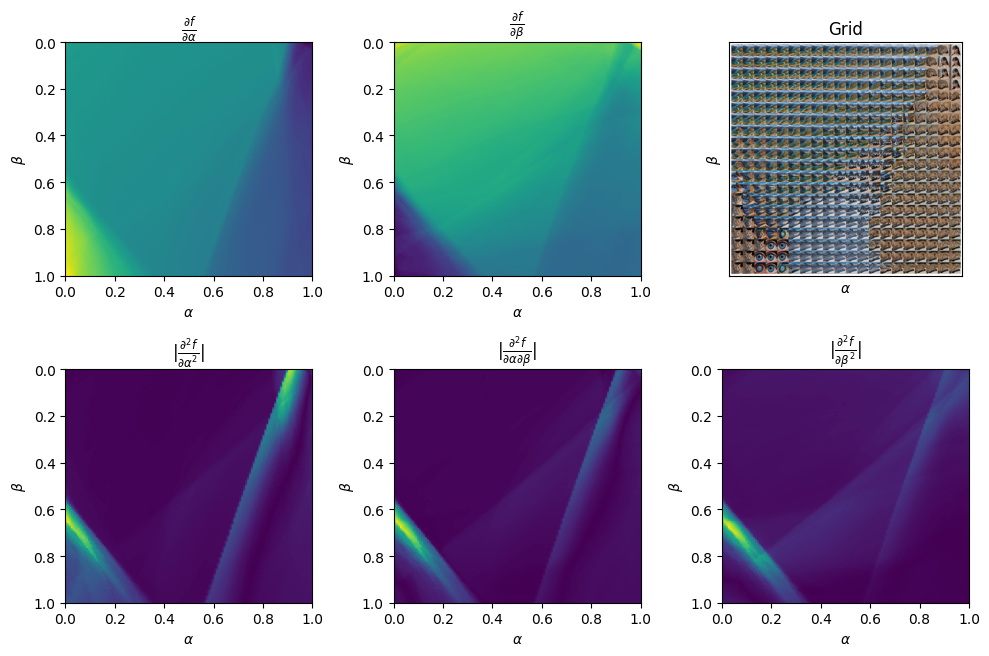

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Dummy data (replace with your actual data)
image_size = 128


# Create a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(10, 6.67)) # Adjust figure size as needed

# First Derivatives
im1 = axes[0, 0].imshow(dfdT.reshape(image_size, image_size).T, origin='upper', extent=[0, 1, 1, 0], cmap='viridis', aspect='auto')
axes[0, 0].set_xlabel(r'$\alpha$')
axes[0, 0].set_ylabel(r'$\beta$')
axes[0, 0].set_title(r'$\frac{\partial f}{\partial \alpha}$')  # Use LaTeX for better rendering


im2 = axes[0, 1].imshow(dfdH.reshape(image_size, image_size).T, origin='upper', extent=[0, 1, 1, 0], cmap='viridis', aspect='auto')
axes[0, 1].set_xlabel(r'$\alpha$')
axes[0, 1].set_ylabel(r'$\beta$')
axes[0, 1].set_title(r'$\frac{\partial f}{\partial \beta}$')


# Second Derivatives
im3 = axes[1, 0].imshow(np.abs(d2fdT2.reshape(image_size, image_size).T), origin='upper', extent=[0, 1, 1, 0], cmap='viridis', aspect='auto')
axes[1, 0].set_xlabel(r'$\alpha$')
axes[1, 0].set_ylabel(r'$\beta$')
axes[1, 0].set_title(r'$|\frac{\partial^2 f}{\partial \alpha^2}|$')

im4 = axes[1, 1].imshow(np.abs(d2fdTdH.reshape(image_size, image_size).T), origin='upper', extent=[0, 1, 1, 0], cmap='viridis', aspect='auto')
axes[1, 1].set_xlabel(r'$\alpha$')
axes[1, 1].set_ylabel(r'$\beta$')
axes[1, 1].set_title(r'$|\frac{\partial^2 f}{\partial \alpha \partial \beta}|$')

im5 = axes[1, 2].imshow(np.abs(d2fdH2.reshape(image_size, image_size).T), origin='upper', extent=[0, 1, 1, 0], cmap='viridis', aspect='auto')
axes[1, 2].set_xlabel(r'$\alpha$')
axes[1, 2].set_ylabel(r'$\beta$')
axes[1, 2].set_title(r'$|\frac{\partial^2 f}{\partial \beta^2}|$')


img = mpimg.imread('output_grid_tight.png') # Replace 'output_grid_lower.png'
axes[0, 2].imshow(img)
axes[0, 2].set_xlabel(r'$\alpha$')
axes[0, 2].set_ylabel(r'$\beta$')
axes[0, 2].set_title('Grid') # Set a title for the image
axes[0, 2].set_xticks([]) # Remove ticks if you don't need them
axes[0, 2].set_yticks([])


# Remove the empty subplot (if you only have 5 plots)
# fig.delaxes(axes[0,2])



# Add a shared colorbar (optional)
# fig.colorbar(im1, ax=axes.ravel().tolist(), orientation='vertical', fraction=0.05) # Adjust fraction as needed

# Adjust layout
plt.tight_layout()

# Save the figure (optional)
# plt.savefig("derivatives_plot.pdf", bbox_inches='tight')  # Use .pdf for vector graphics

# Show the plot
plt.show()

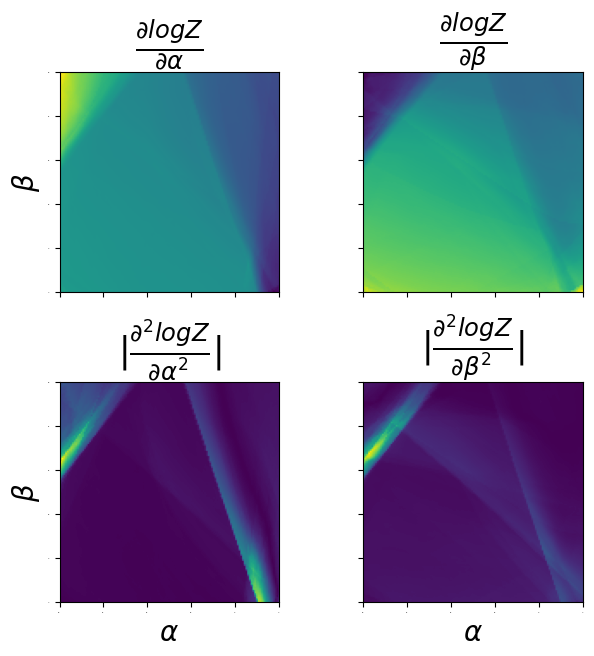

In [75]:
import matplotlib.pyplot as plt
import numpy as np

# Dummy data (replace with your actual data)

fontsize = 25  # Adjust fontsize as needed

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(6.67, 6.67), sharex=True, sharey=True)  # Adjust figure size as needed

# First Derivatives
im1 = axes[0, 0].imshow(dfdT.reshape(image_size, image_size).T, origin='lower', extent=[0, 1, 1, 0], cmap='viridis', aspect='equal')
# axes[0, 0].set_xlabel(r'$\alpha$', fontsize=fontsize)
axes[0, 0].set_ylabel(r'$\beta$', fontsize=fontsize-5)
axes[0, 0].set_title(r'$\frac{\partial log Z}{\partial \alpha}$', fontsize=fontsize)
axes[0, 0].tick_params(axis='both', labelsize=0)

im2 = axes[0, 1].imshow(dfdH.reshape(image_size, image_size).T, origin='lower', extent=[0, 1, 1, 0], cmap='viridis', aspect='equal')
# axes[0, 1].set_xlabel(r'$\alpha$', fontsize=fontsize)
# axes[0, 1].set_ylabel(r'$\beta$', fontsize=fontsize)
axes[0, 1].set_title(r'$\frac{\partial log Z}{\partial \beta}$', fontsize=fontsize)
axes[0, 1].tick_params(axis='both', labelsize=0)

# Second Derivatives
im3 = axes[1, 0].imshow(np.abs(d2fdT2.reshape(image_size, image_size).T), origin='lower', extent=[0, 1, 1, 0], cmap='viridis', aspect='equal')
axes[1, 0].set_xlabel(r'$\alpha$', fontsize=fontsize-5)
axes[1, 0].set_ylabel(r'$\beta$', fontsize=fontsize-5)
axes[1, 0].set_title(r'$|\frac{\partial^2 log Z}{\partial \alpha^2}|$', fontsize=fontsize)
axes[1, 0].tick_params(axis='both', labelsize=0)

im5 = axes[1, 1].imshow(np.abs(d2fdH2.reshape(image_size, image_size).T), origin='lower', extent=[0, 1, 1, 0], cmap='viridis', aspect='equal')
axes[1, 1].set_xlabel(r'$\alpha$', fontsize=fontsize-5)
# axes[1, 1].set_ylabel(r'$\beta$', fontsize=fontsize)
axes[1, 1].set_title(r'$|\frac{\partial^2 log Z}{\partial \beta^2}|$', fontsize=fontsize)
axes[1, 1].tick_params(axis='both', labelsize=0)


plt.tight_layout()
plt.savefig("deriv_v2.png",dpi=300, bbox_inches='tight') 
# Show the plot
plt.show()

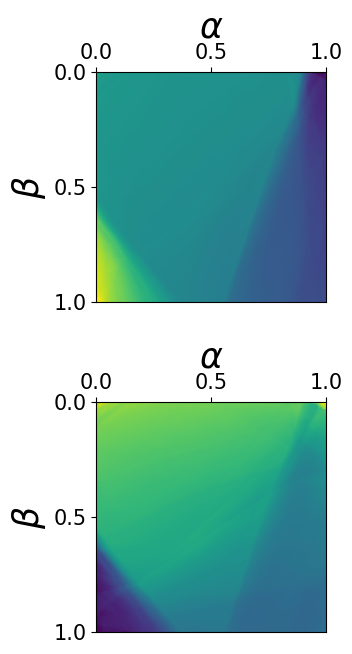

In [38]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6.75133 / 2, 6.75133))

fontsize = 25  # Shared font size for labels
tick_fontsize = 15  # Font size for tick numbers
tick_values = [0, 0.5, 1]  # Define tick positions

# Plot df/dT
ax1 = plt.subplot(211)
im1 = ax1.imshow(dfdT.reshape(image_size, image_size).T, origin='upper', extent=[0, 1, 1, 0])
ax1.set_xlabel(r'$\alpha$', fontsize=fontsize)  
ax1.set_ylabel(r'$\beta$', fontsize=fontsize)  

# Move x-ticks to the top and keep y-ticks on the left
ax1.xaxis.set_ticks_position('top')  
ax1.yaxis.set_ticks_position('left')  
ax1.xaxis.set_label_position('top')  

# Set tick positions and font size
ax1.set_xticks(tick_values)
ax1.set_yticks(tick_values)
ax1.tick_params(labelsize=tick_fontsize)

# Plot df/dH
ax2 = plt.subplot(212)
im2 = ax2.imshow(dfdH.reshape(image_size, image_size).T, origin='upper', extent=[0, 1, 1, 0])
ax2.set_xlabel(r'$\alpha$', fontsize=fontsize)  
ax2.set_ylabel(r'$\beta$', fontsize=fontsize)  

# Move x-ticks to the top and keep y-ticks on the left
ax2.xaxis.set_ticks_position('top')  
ax2.yaxis.set_ticks_position('left')  
ax2.xaxis.set_label_position('top')  

# Set tick positions and font size
ax2.set_xticks(tick_values)
ax2.set_yticks(tick_values)
ax2.tick_params(labelsize=tick_fontsize)

# Adjust layout
plt.tight_layout()
plt.show()


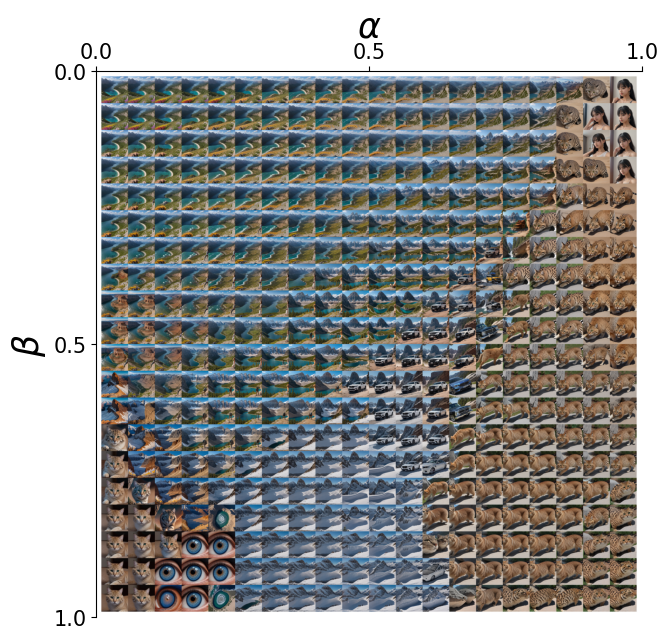

In [46]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load image
img = mpimg.imread('output_grid_tight.png')

# Create figure
plt.figure(figsize=(6.75133 , 6.75133))

fontsize = 25  # Font size for labels
tick_fontsize = 15  # Font size for tick numbers
tick_values = [0, 0.5, 1]  # Define tick positions

# Plot image
ax = plt.gca()  # Get current axis
ax.imshow(img, origin='upper', extent=[0, 1, 1, 0])  # Keep extent for proper alignment

# Set labels
ax.set_xlabel(r'$\alpha$', fontsize=fontsize)  
ax.set_ylabel(r'$\beta$', fontsize=fontsize)  

# Move ticks to top and left
ax.xaxis.set_ticks_position('top')  
ax.yaxis.set_ticks_position('left')  
ax.xaxis.set_label_position('top')  

# Set tick positions and font size
ax.set_xticks(tick_values)
ax.set_yticks(tick_values)
ax.tick_params(labelsize=tick_fontsize)

# Remove grid and unnecessary spines
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Adjust layout
plt.tight_layout()
# plt.show()

# Save figure with high DPI
plt.savefig('output_high_res.png', dpi=500, bbox_inches='tight')

# Show the figure
plt.show()


<Figure size 640x480 with 0 Axes>